Testing on device: cuda
MEDICAL FUSION MODEL TESTING PIPELINE
Loading model from medical_fusion_finetuned.pth...
Model loaded successfully!
Training epoch: 18
Best validation loss: 8.358689880371093
Test dataset: 573 CT-MRI pairs

Starting comprehensive evaluation on 573 samples...

1️⃣  Running comprehensive metrics evaluation...
Running comprehensive evaluation...
Model loaded successfully!
Training epoch: 18
Best validation loss: 8.358689880371093
Test dataset: 573 CT-MRI pairs

Starting comprehensive evaluation on 573 samples...

1️⃣  Running comprehensive metrics evaluation...
Running comprehensive evaluation...


Evaluating: 100%|██████████| 573/573 [01:11<00:00,  8.05it/s]




2️⃣  Creating detailed visualizations...


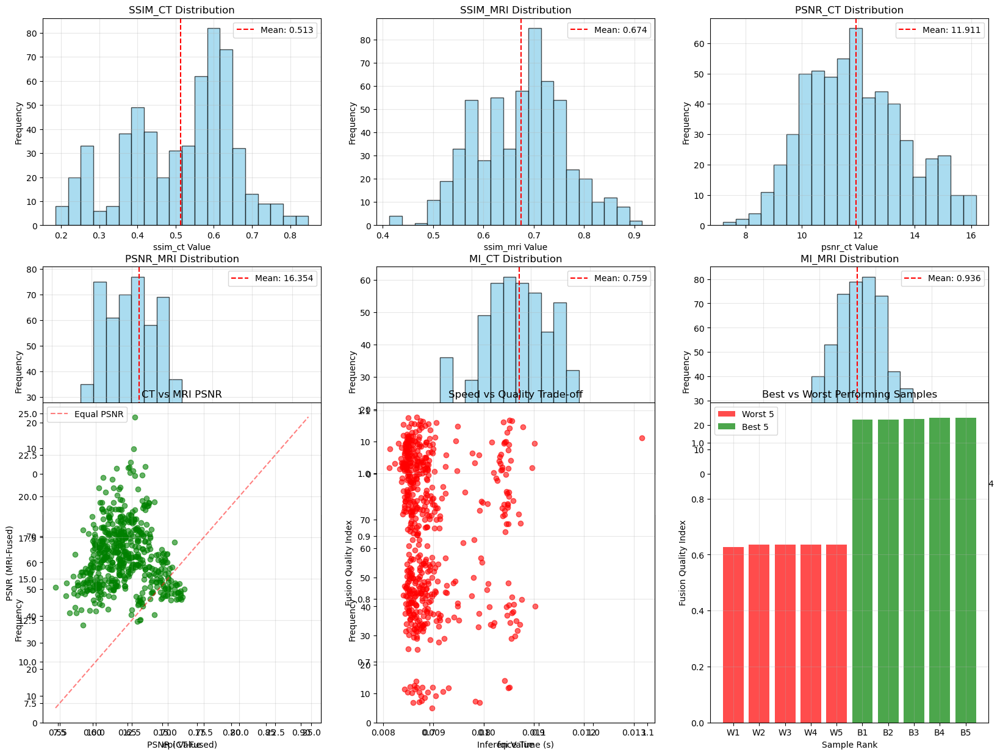


3️⃣  Generating comprehensive report...

COMPREHENSIVE MEDICAL FUSION MODEL EVALUATION REPORT

📊 DATASET STATISTICS
Total test samples: 573
Average inference time: 0.0090 ± 0.0007 seconds
Inference speed: 111.66 images/second

🎯 FUSION QUALITY METRICS
SSIM_CT      | Mean: 0.5125 ± 0.1403 | Range: [0.1856, 0.8475] | Median: 0.5504
SSIM_MRI     | Mean: 0.6744 ± 0.0886 | Range: [0.4130, 0.9156] | Median: 0.6871
PSNR_CT      | Mean: 11.9113 ± 1.7611 | Range: [7.2012, 16.1744] | Median: 11.7457
PSNR_MRI     | Mean: 16.3537 ± 1.8812 | Range: [12.1965, 24.7962] | Median: 16.2029
MI_CT        | Mean: 0.7592 ± 0.1572 | Range: [0.3215, 1.1752] | Median: 0.7532
MI_MRI       | Mean: 0.9359 ± 0.1430 | Range: [0.4577, 1.3586] | Median: 0.9462
EPI          | Mean: 0.7470 ± 0.0750 | Range: [0.5465, 0.9108] | Median: 0.7491
FQI          | Mean: 0.9091 ± 0.1174 | Range: [0.6267, 1.0900] | Median: 0.9391

🔍 PERFORMANCE ANALYSIS
Best performing samples (Top 5 FQI):
  1. 28017: FQI = 1.0834
  2. 41020: FQ

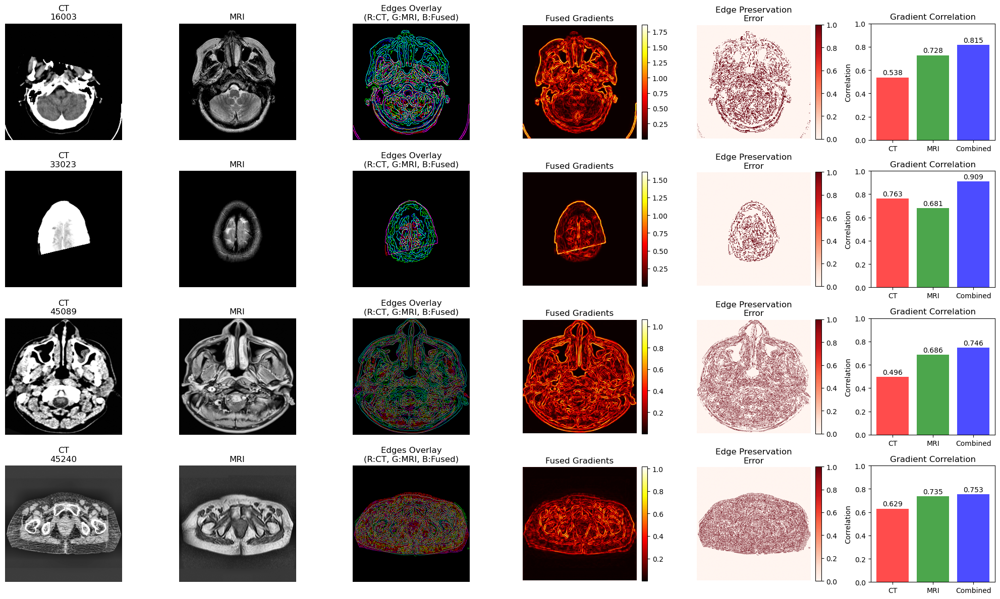


5️⃣  Visualizing attention mechanisms...


<Figure size 1600x800 with 0 Axes>


6️⃣  Benchmarking performance...
Benchmarking model performance...
Batch:  1, Size:  128x 128, Time: 0.0167s, Memory: 0.90GB, Throughput: 60.05 img/s
Batch:  1, Size:  256x 256, Time: 0.0163s, Memory: 0.90GB, Throughput: 61.23 img/s
Batch:  1, Size:  512x 512, Time: 0.0153s, Memory: 0.90GB, Throughput: 65.44 img/s
Batch:  1, Size:  256x 256, Time: 0.0163s, Memory: 0.90GB, Throughput: 61.23 img/s
Batch:  1, Size:  512x 512, Time: 0.0153s, Memory: 0.90GB, Throughput: 65.44 img/s
Batch:  1, Size: 1024x1024, Time: 0.0154s, Memory: 0.92GB, Throughput: 65.14 img/s
Batch:  1, Size: 1024x1024, Time: 0.0154s, Memory: 0.92GB, Throughput: 65.14 img/s
Batch:  2, Size:  128x 128, Time: 0.0256s, Memory: 0.93GB, Throughput: 78.15 img/s
Batch:  2, Size:  128x 128, Time: 0.0256s, Memory: 0.93GB, Throughput: 78.15 img/s
Batch:  2, Size:  256x 256, Time: 0.0253s, Memory: 0.92GB, Throughput: 79.20 img/s
Batch:  2, Size:  256x 256, Time: 0.0253s, Memory: 0.92GB, Throughput: 79.20 img/s
Batch:  2, Size:  5

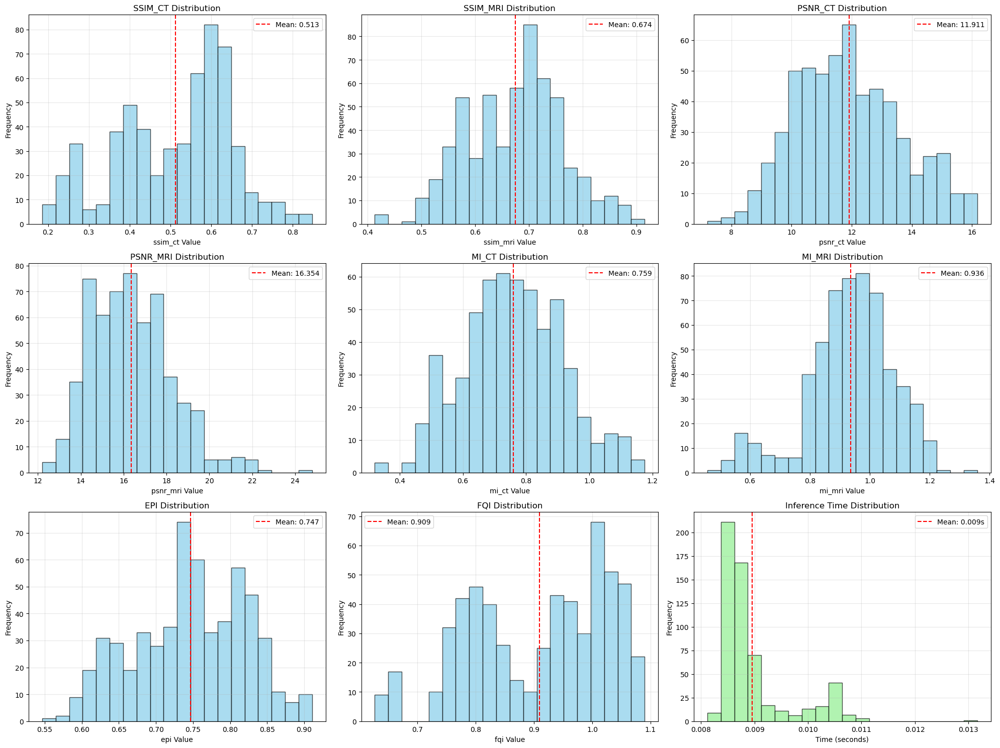

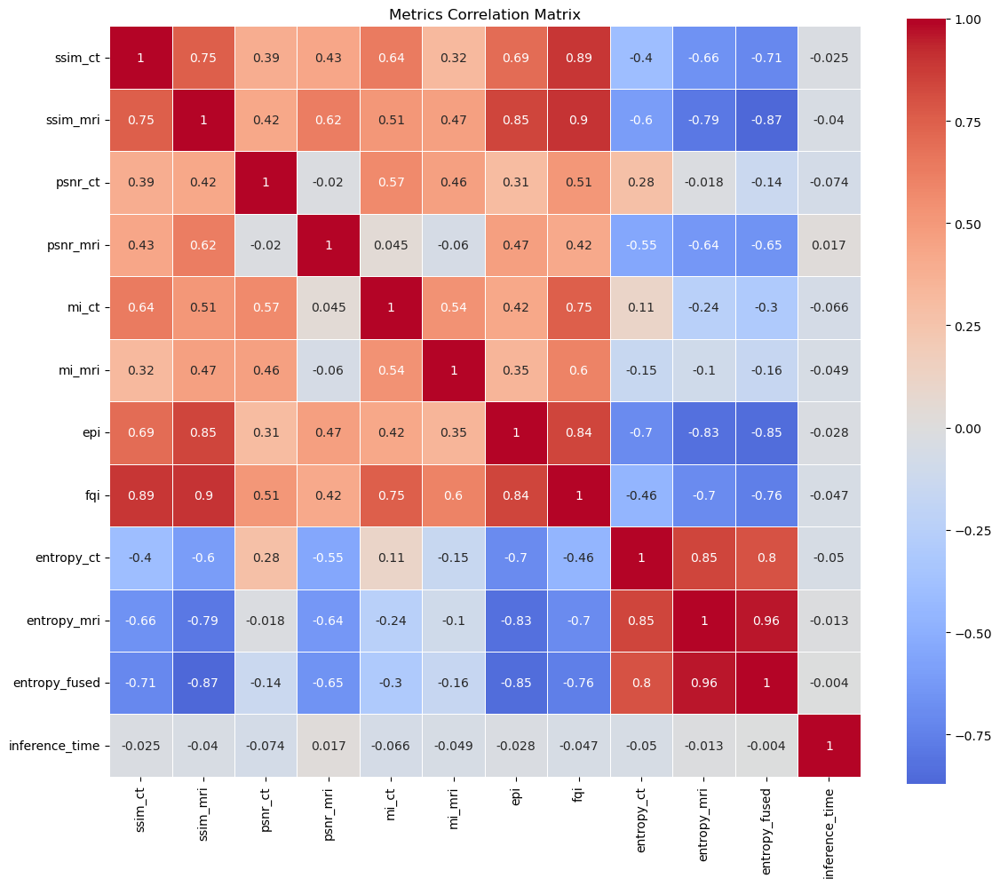

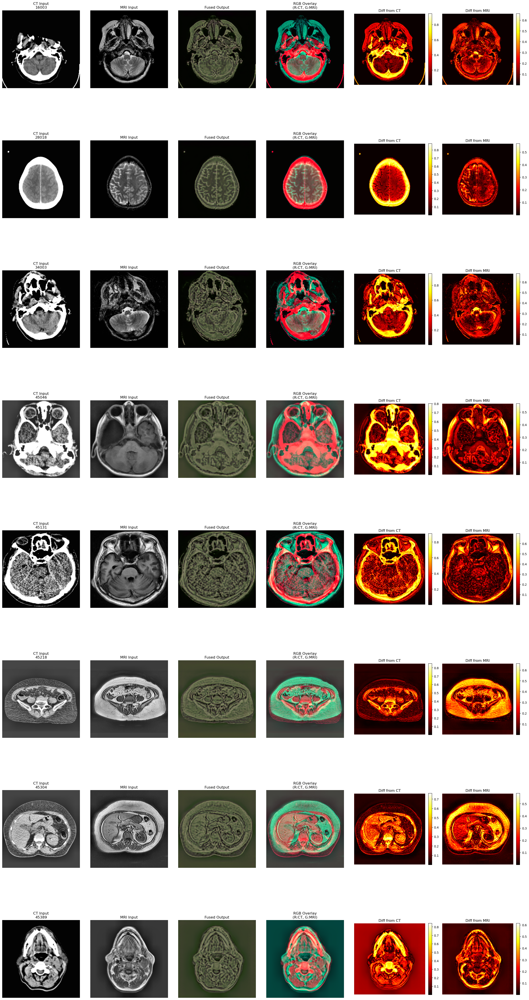

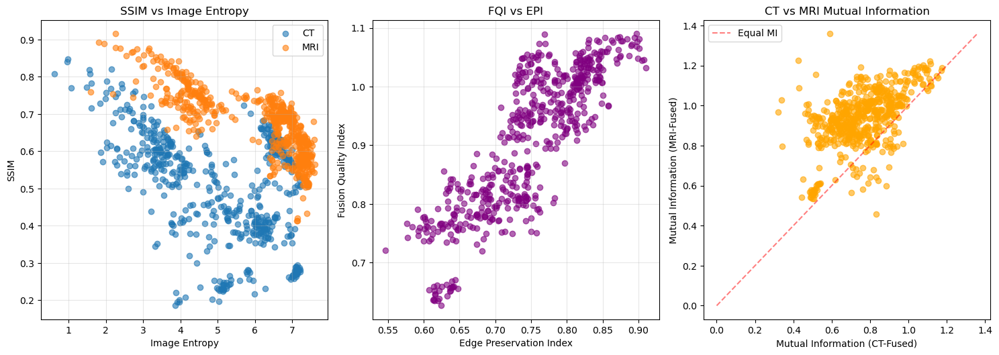


✅ TESTING COMPLETED!
All results saved to: test_results/
Files generated:
  - metrics_distributions.png
  - correlation_matrix.png
  - fusion_samples_detailed.png
  - performance_analysis.png
  - edge_analysis.png
  - attention_visualization.png
  - performance_characteristics.png
  - detailed_metrics.csv
  - summary_statistics.json
  - performance_benchmark.csv


In [2]:
# MEDICAL IMAGE FUSION MODEL TESTING & EVALUATION
# Comprehensive testing suite for the fine-tuned medical fusion model

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
import cv2
import numpy as np
from PIL import Image
import os
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
import json
from tqdm import tqdm
import warnings
from skimage import filters, feature, measure
from skimage.metrics import structural_similarity as ssim, peak_signal_noise_ratio as psnr
from sklearn.metrics import mutual_info_score
import pandas as pd
from scipy.stats import pearsonr
from scipy.ndimage import sobel
import time
warnings.filterwarnings('ignore')

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Testing on device: {device}")

# Configuration
test_config = {
    'model_path': 'medical_fusion_finetuned.pth',
    'test_ct_path': 'Dataset/CT-MRI/CT',
    'test_mri_path': 'Dataset/CT-MRI/MRI',
    'batch_size': 1,
    'num_workers': 0,
    'save_results': True,
    'results_dir': 'test_results',
    'device': device,
    
    # Visualization settings
    'num_samples_visualize': 8,
    'figure_dpi': 150,
    'save_individual_results': True,
}

# Create results directory
os.makedirs(test_config['results_dir'], exist_ok=True)

# Import model components (same as training script)
class SpatialAttention(nn.Module):
    def __init__(self, in_channels):
        super().__init__()
        self.conv = nn.Conv2d(in_channels, 1, kernel_size=7, padding=3)
        self.sigmoid = nn.Sigmoid()
        
    def forward(self, x):
        attention = self.conv(x)
        attention = self.sigmoid(attention)
        return x * attention

class ChannelAttention(nn.Module):
    def __init__(self, in_channels, reduction=16):
        super().__init__()
        self.avg_pool = nn.AdaptiveAvgPool2d(1)
        self.fc = nn.Sequential(
            nn.Linear(in_channels, in_channels // reduction, bias=False),
            nn.ReLU(inplace=True),
            nn.Linear(in_channels // reduction, in_channels, bias=False),
            nn.Sigmoid()
        )
        
    def forward(self, x):
        b, c, _, _ = x.size()
        y = self.avg_pool(x).view(b, c)
        y = self.fc(y).view(b, c, 1, 1)
        return x * y.expand_as(x)

class DualAttentionFusion(nn.Module):
    def __init__(self, channels):
        super().__init__()
        self.channel_attention = ChannelAttention(channels)
        self.spatial_attention = SpatialAttention(channels)
        
        self.fusion_conv = nn.Sequential(
            nn.Conv2d(channels * 2, channels, 3, padding=1),
            nn.BatchNorm2d(channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(channels, channels, 3, padding=1),
            nn.BatchNorm2d(channels),
            nn.ReLU(inplace=True)
        )
        
    def forward(self, vis_feat, ir_feat):
        vis_att = self.spatial_attention(self.channel_attention(vis_feat))
        ir_att = self.spatial_attention(self.channel_attention(ir_feat))
        
        combined = torch.cat([vis_att, ir_att], dim=1)
        fused = self.fusion_conv(combined)
        
        return fused

class AdaptiveInputLayer(nn.Module):
    def __init__(self, target_size=256):
        super().__init__()
        self.target_size = target_size
        
    def forward(self, x):
        if x.size(2) != self.target_size or x.size(3) != self.target_size:
            x = F.interpolate(x, size=(self.target_size, self.target_size), 
                            mode='bilinear', align_corners=False)
        return x

class AdaptiveOutputLayer(nn.Module):
    def __init__(self):
        super().__init__()
        
    def forward(self, x, target_size):
        if x.size(2) != target_size[0] or x.size(3) != target_size[1]:
            x = F.interpolate(x, size=target_size, mode='bilinear', align_corners=False)
        return x

class MedicalFusionModel(nn.Module):
    def __init__(self):
        super().__init__()
        
        # Import ResNet
        import torchvision.models as models
        
        # Adaptive layers
        self.ct_input_adapter = AdaptiveInputLayer(target_size=256)
        self.mri_input_adapter = AdaptiveInputLayer(target_size=256)
        
        # Backbone
        backbone = models.resnet34(pretrained=True)
        
        # CT encoder
        self.ct_stem = nn.Sequential(
            backbone.conv1, backbone.bn1, backbone.relu, backbone.maxpool
        )
        self.ct_layer1 = backbone.layer1
        self.ct_layer2 = backbone.layer2
        self.ct_layer3 = backbone.layer3
        self.ct_layer4 = backbone.layer4
        
        # MRI encoder
        mri_backbone = models.resnet34(pretrained=True)
        old_conv1 = mri_backbone.conv1
        mri_backbone.conv1 = nn.Conv2d(1, 64, kernel_size=7, stride=2, padding=3, bias=False)
        with torch.no_grad():
            mri_backbone.conv1.weight = nn.Parameter(old_conv1.weight.mean(dim=1, keepdim=True))
            
        self.mri_stem = nn.Sequential(
            mri_backbone.conv1, mri_backbone.bn1, mri_backbone.relu, mri_backbone.maxpool
        )
        self.mri_layer1 = mri_backbone.layer1
        self.mri_layer2 = mri_backbone.layer2
        self.mri_layer3 = mri_backbone.layer3
        self.mri_layer4 = mri_backbone.layer4
        
        # Fusion blocks
        self.fusion1 = DualAttentionFusion(64)
        self.fusion2 = DualAttentionFusion(128)
        self.fusion3 = DualAttentionFusion(256)
        self.fusion4 = DualAttentionFusion(512)
        
        # Decoder
        self.decoder4 = nn.Sequential(
            nn.ConvTranspose2d(512, 256, 4, stride=2, padding=1),
            nn.BatchNorm2d(256), nn.ReLU(inplace=True)
        )
        
        self.decoder3 = nn.Sequential(
            nn.Conv2d(256 + 256, 256, 3, padding=1), nn.BatchNorm2d(256), nn.ReLU(inplace=True),
            nn.ConvTranspose2d(256, 128, 4, stride=2, padding=1),
            nn.BatchNorm2d(128), nn.ReLU(inplace=True)
        )
        
        self.decoder2 = nn.Sequential(
            nn.Conv2d(128 + 128, 128, 3, padding=1), nn.BatchNorm2d(128), nn.ReLU(inplace=True),
            nn.ConvTranspose2d(128, 64, 4, stride=2, padding=1),
            nn.BatchNorm2d(64), nn.ReLU(inplace=True)
        )
        
        self.decoder1 = nn.Sequential(
            nn.Conv2d(64 + 64, 64, 3, padding=1), nn.BatchNorm2d(64), nn.ReLU(inplace=True),
            nn.ConvTranspose2d(64, 32, 4, stride=2, padding=1),
            nn.BatchNorm2d(32), nn.ReLU(inplace=True)
        )
        
        self.final = nn.Sequential(
            nn.Upsample(scale_factor=2, mode='bilinear', align_corners=False),
            nn.Conv2d(32, 16, 3, padding=1), nn.BatchNorm2d(16), nn.ReLU(inplace=True),
            nn.Conv2d(16, 3, 1), nn.Sigmoid()
        )
        
        self.medical_attention = nn.Sequential(
            nn.Conv2d(3, 16, 3, padding=1), nn.ReLU(inplace=True),
            nn.Conv2d(16, 3, 1), nn.Sigmoid()
        )
        
        self.output_adapter = AdaptiveOutputLayer()
        
    def forward(self, ct, mri):
        original_size = (ct.size(2), ct.size(3))
        
        ct = self.ct_input_adapter(ct)
        mri = self.mri_input_adapter(mri)
        
        # Encode
        c0 = self.ct_stem(ct)
        c1, c2, c3, c4 = self.ct_layer1(c0), self.ct_layer2(self.ct_layer1(c0)), self.ct_layer3(self.ct_layer2(self.ct_layer1(c0))), self.ct_layer4(self.ct_layer3(self.ct_layer2(self.ct_layer1(c0))))
        
        m0 = self.mri_stem(mri)
        m1, m2, m3, m4 = self.mri_layer1(m0), self.mri_layer2(self.mri_layer1(m0)), self.mri_layer3(self.mri_layer2(self.mri_layer1(m0))), self.mri_layer4(self.mri_layer3(self.mri_layer2(self.mri_layer1(m0))))
        
        # Fuse
        f1, f2, f3, f4 = self.fusion1(c1, m1), self.fusion2(c2, m2), self.fusion3(c3, m3), self.fusion4(c4, m4)
        
        # Decode
        d4 = self.decoder4(f4)
        d3 = self.decoder3(torch.cat([d4, f3], dim=1))
        d2 = self.decoder2(torch.cat([d3, f2], dim=1))
        d1 = self.decoder1(torch.cat([d2, f1], dim=1))
        
        output = self.final(d1)
        attention = self.medical_attention(output)
        output = output * attention
        
        return self.output_adapter(output, original_size)

# Medical Image Processing (simplified from training script)
class MedicalImageProcessor:
    @staticmethod
    def load_image(filepath):
        img = cv2.imread(str(filepath), cv2.IMREAD_UNCHANGED)
        if img is None:
            img = np.array(Image.open(filepath).convert('L'))
        return img.astype(np.float32)
    
    @staticmethod
    def normalize_image(img):
        return (img - img.min()) / (img.max() - img.min() + 1e-8)
    
    @staticmethod
    def enhance_contrast(img):
        """Apply CLAHE for contrast enhancement"""
        # Ensure single channel for CLAHE
        if len(img.shape) > 2:
            img = np.mean(img, axis=2)  # Convert to grayscale if multi-channel
        
        img_uint8 = (img * 255).astype(np.uint8)
        clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
        enhanced = clahe.apply(img_uint8)
        return enhanced.astype(np.float32) / 255.0

# Test Dataset
class MedicalTestDataset(Dataset):
    def __init__(self, ct_path, mri_path):
        self.ct_path = Path(ct_path)
        self.mri_path = Path(mri_path)
        self.pairs = self._find_pairs()
        
        self.transform = transforms.Compose([
            transforms.ToPILImage(),
            transforms.ToTensor(),
        ])
        
        print(f"Test dataset: {len(self.pairs)} CT-MRI pairs")
    
    def _find_pairs(self):
        ct_files = list(self.ct_path.glob('*.jpg')) + list(self.ct_path.glob('*.png'))
        mri_files = list(self.mri_path.glob('*.jpg')) + list(self.mri_path.glob('*.png'))
        
        ct_names = {f.stem: f for f in ct_files}
        mri_names = {f.stem: f for f in mri_files}
        
        return [(ct_names[name], mri_names[name]) for name in ct_names.keys() if name in mri_names]
    
    def __len__(self):
        return len(self.pairs)
    
    def __getitem__(self, idx):
        ct_path, mri_path = self.pairs[idx]
        
        # Load and preprocess
        ct_img = MedicalImageProcessor.load_image(ct_path)
        mri_img = MedicalImageProcessor.load_image(mri_path)
        
        ct_img = MedicalImageProcessor.normalize_image(ct_img)
        ct_img = MedicalImageProcessor.enhance_contrast(ct_img)
        
        mri_img = MedicalImageProcessor.normalize_image(mri_img)
        mri_img = MedicalImageProcessor.enhance_contrast(mri_img)
        
        if len(ct_img.shape) > 2:
            ct_img = ct_img.squeeze()
        if len(mri_img.shape) > 2:
            mri_img = mri_img.squeeze()
        
        ct_tensor = self.transform(ct_img)
        mri_tensor = self.transform(mri_img)
        
        if ct_tensor.shape[0] == 1:
            ct_tensor = ct_tensor.repeat(3, 1, 1)
        
        return ct_tensor, mri_tensor, ct_path.stem

# Comprehensive Evaluation Metrics
class FusionMetrics:
    @staticmethod
    def ssim_metric(img1, img2):
        """Structural Similarity Index"""
        return ssim(img1, img2, data_range=1.0)
    
    @staticmethod
    def psnr_metric(img1, img2):
        """Peak Signal-to-Noise Ratio"""
        return psnr(img1, img2, data_range=1.0)
    
    @staticmethod
    def mutual_information(img1, img2, bins=256):
        """Mutual Information between two images"""
        hist_2d, _, _ = np.histogram2d(img1.flatten(), img2.flatten(), bins=bins)
        return mutual_info_score(None, None, contingency=hist_2d)
    
    @staticmethod
    def edge_preservation_index(fused, img1, img2):
        """Edge Preservation Index"""
        def sobel_edges(img):
            return np.sqrt(sobel(img, axis=0)**2 + sobel(img, axis=1)**2)
        
        edges_fused = sobel_edges(fused)
        edges_img1 = sobel_edges(img1)
        edges_img2 = sobel_edges(img2)
        
        # Take maximum edge information as reference
        edges_ref = np.maximum(edges_img1, edges_img2)
        
        # Calculate correlation
        corr, _ = pearsonr(edges_fused.flatten(), edges_ref.flatten())
        return max(0, corr)
    
    @staticmethod
    def gradient_magnitude(img):
        """Calculate gradient magnitude"""
        grad_x = sobel(img, axis=0)
        grad_y = sobel(img, axis=1)
        return np.sqrt(grad_x**2 + grad_y**2)
    
    @staticmethod
    def fusion_quality_index(fused, img1, img2):
        """Overall fusion quality metric"""
        # Combine multiple metrics
        ssim1 = FusionMetrics.ssim_metric(fused, img1)
        ssim2 = FusionMetrics.ssim_metric(fused, img2)
        
        mi1 = FusionMetrics.mutual_information(fused, img1)
        mi2 = FusionMetrics.mutual_information(fused, img2)
        
        epi = FusionMetrics.edge_preservation_index(fused, img1, img2)
        
        # Weighted combination
        fqi = 0.3 * (ssim1 + ssim2) + 0.3 * (mi1 + mi2) / 2 + 0.4 * epi
        return fqi
    
    @staticmethod
    def entropy(img):
        """Image entropy"""
        hist, _ = np.histogram(img.flatten(), bins=256, range=(0, 1))
        hist = hist / hist.sum()
        hist = hist[hist > 0]
        return -np.sum(hist * np.log2(hist))

# Model Loading and Testing
def load_test_model():
    """Load the trained model for testing"""
    print(f"Loading model from {test_config['model_path']}...")
    
    model = MedicalFusionModel().to(test_config['device'])
    
    if os.path.exists(test_config['model_path']):
        checkpoint = torch.load(test_config['model_path'], map_location=test_config['device'])
        model.load_state_dict(checkpoint['model_state_dict'])
        
        print("Model loaded successfully!")
        print(f"Training epoch: {checkpoint.get('epoch', 'Unknown')}")
        print(f"Best validation loss: {checkpoint.get('best_val_loss', 'Unknown')}")
        
        return model, checkpoint
    else:
        print(f"Error: Model file not found at {test_config['model_path']}")
        return None, None

def comprehensive_evaluation(model, test_dataset):
    """Comprehensive evaluation with all metrics"""
    model.eval()
    test_loader = DataLoader(
        test_dataset, 
        batch_size=test_config['batch_size'],
        shuffle=False, 
        num_workers=test_config['num_workers']
    )
    
    # Metrics storage
    all_metrics = {
        'ssim_ct': [], 'ssim_mri': [], 'psnr_ct': [], 'psnr_mri': [],
        'mi_ct': [], 'mi_mri': [], 'epi': [], 'fqi': [],
        'entropy_ct': [], 'entropy_mri': [], 'entropy_fused': [],
        'inference_time': [], 'image_names': []
    }
    
    print("Running comprehensive evaluation...")
    
    with torch.no_grad():
        for ct, mri, names in tqdm(test_loader, desc="Evaluating"):
            ct = ct.to(test_config['device'])
            mri = mri.to(test_config['device'])
            
            # Time inference
            start_time = time.time()
            fused = model(ct, mri)
            inference_time = time.time() - start_time
            
            # Convert to numpy for metrics
            ct_np = ct[0].cpu().numpy()
            mri_np = mri[0, 0].cpu().numpy()
            fused_np = fused[0].cpu().numpy()
            
            # Convert CT to grayscale for fair comparison
            ct_gray = 0.299 * ct_np[0] + 0.587 * ct_np[1] + 0.114 * ct_np[2]
            fused_gray = 0.299 * fused_np[0] + 0.587 * fused_np[1] + 0.114 * fused_np[2]
            
            # Calculate all metrics
            ssim_ct = FusionMetrics.ssim_metric(fused_gray, ct_gray)
            ssim_mri = FusionMetrics.ssim_metric(fused_gray, mri_np)
            
            psnr_ct = FusionMetrics.psnr_metric(fused_gray, ct_gray)
            psnr_mri = FusionMetrics.psnr_metric(fused_gray, mri_np)
            
            mi_ct = FusionMetrics.mutual_information(fused_gray, ct_gray)
            mi_mri = FusionMetrics.mutual_information(fused_gray, mri_np)
            
            epi = FusionMetrics.edge_preservation_index(fused_gray, ct_gray, mri_np)
            fqi = FusionMetrics.fusion_quality_index(fused_gray, ct_gray, mri_np)
            
            entropy_ct = FusionMetrics.entropy(ct_gray)
            entropy_mri = FusionMetrics.entropy(mri_np)
            entropy_fused = FusionMetrics.entropy(fused_gray)
            
            # Store metrics
            all_metrics['ssim_ct'].append(ssim_ct)
            all_metrics['ssim_mri'].append(ssim_mri)
            all_metrics['psnr_ct'].append(psnr_ct)
            all_metrics['psnr_mri'].append(psnr_mri)
            all_metrics['mi_ct'].append(mi_ct)
            all_metrics['mi_mri'].append(mi_mri)
            all_metrics['epi'].append(epi)
            all_metrics['fqi'].append(fqi)
            all_metrics['entropy_ct'].append(entropy_ct)
            all_metrics['entropy_mri'].append(entropy_mri)
            all_metrics['entropy_fused'].append(entropy_fused)
            all_metrics['inference_time'].append(inference_time)
            all_metrics['image_names'].append(names[0])
    
    return all_metrics

def create_detailed_visualizations(model, test_dataset, metrics_data):
    """Create comprehensive visualizations"""
    model.eval()
    test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)
    
    # 1. Statistical Summary
    plt.figure(figsize=(20, 15))
    
    # Metrics distribution plots
    metrics_to_plot = ['ssim_ct', 'ssim_mri', 'psnr_ct', 'psnr_mri', 'mi_ct', 'mi_mri', 'epi', 'fqi']
    
    for i, metric in enumerate(metrics_to_plot):
        plt.subplot(3, 3, i+1)
        plt.hist(metrics_data[metric], bins=20, alpha=0.7, color='skyblue', edgecolor='black')
        plt.title(f'{metric.upper()} Distribution')
        plt.xlabel(f'{metric} Value')
        plt.ylabel('Frequency')
        plt.axvline(np.mean(metrics_data[metric]), color='red', linestyle='--', 
                   label=f'Mean: {np.mean(metrics_data[metric]):.3f}')
        plt.legend()
        plt.grid(True, alpha=0.3)
    
    # PSNR comparison
    plt.subplot(2, 3, 4)
    plt.scatter(metrics_data['psnr_ct'], metrics_data['psnr_mri'], alpha=0.6, color='green')
    plt.xlabel('PSNR (CT-Fused)')
    plt.ylabel('PSNR (MRI-Fused)')
    plt.title('CT vs MRI PSNR')
    plt.plot([min(min(metrics_data['psnr_ct']), min(metrics_data['psnr_mri'])),
              max(max(metrics_data['psnr_ct']), max(metrics_data['psnr_mri']))],
             [min(min(metrics_data['psnr_ct']), min(metrics_data['psnr_mri'])),
              max(max(metrics_data['psnr_ct']), max(metrics_data['psnr_mri']))], 
             'r--', alpha=0.5, label='Equal PSNR')
    plt.legend()
    plt.grid(True, alpha=0.3)
    
    # Inference time vs FQI
    plt.subplot(2, 3, 5)
    plt.scatter(metrics_data['inference_time'], metrics_data['fqi'], alpha=0.6, color='red')
    plt.xlabel('Inference Time (s)')
    plt.ylabel('Fusion Quality Index')
    plt.title('Speed vs Quality Trade-off')
    plt.grid(True, alpha=0.3)
    
    # Best vs Worst samples
    plt.subplot(2, 3, 6)
    fqi_sorted_idx = np.argsort(metrics_data['fqi'])
    worst_5 = fqi_sorted_idx[:5]
    best_5 = fqi_sorted_idx[-5:]
    
    plt.bar(range(5), [metrics_data['fqi'][i] for i in worst_5], 
            alpha=0.7, color='red', label='Worst 5')
    plt.bar(range(5, 10), [metrics_data['fqi'][i] for i in best_5], 
            alpha=0.7, color='green', label='Best 5')
    plt.xlabel('Sample Rank')
    plt.ylabel('Fusion Quality Index')
    plt.title('Best vs Worst Performing Samples')
    plt.legend()
    plt.xticks(range(10), [f'W{i+1}' for i in range(5)] + [f'B{i+1}' for i in range(5)])
    plt.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.savefig(f'{test_config["results_dir"]}/performance_analysis.png',
                dpi=test_config['figure_dpi'], bbox_inches='tight')
    plt.show()

def generate_comprehensive_report(metrics_data, model_info):
    """Generate detailed evaluation report"""
    
    print("\n" + "="*80)
    print("COMPREHENSIVE MEDICAL FUSION MODEL EVALUATION REPORT")
    print("="*80)
    
    # Basic Statistics
    print(f"\n📊 DATASET STATISTICS")
    print(f"Total test samples: {len(metrics_data['image_names'])}")
    print(f"Average inference time: {np.mean(metrics_data['inference_time']):.4f} ± {np.std(metrics_data['inference_time']):.4f} seconds")
    print(f"Inference speed: {1/np.mean(metrics_data['inference_time']):.2f} images/second")
    
    # Performance Metrics
    print(f"\n🎯 FUSION QUALITY METRICS")
    metrics_stats = {}
    key_metrics = ['ssim_ct', 'ssim_mri', 'psnr_ct', 'psnr_mri', 'mi_ct', 'mi_mri', 'epi', 'fqi']
    
    for metric in key_metrics:
        values = metrics_data[metric]
        stats = {
            'mean': np.mean(values),
            'std': np.std(values),
            'median': np.median(values),
            'min': np.min(values),
            'max': np.max(values),
            'q25': np.percentile(values, 25),
            'q75': np.percentile(values, 75)
        }
        metrics_stats[metric] = stats
        
        print(f"{metric.upper():12} | Mean: {stats['mean']:.4f} ± {stats['std']:.4f} | "
              f"Range: [{stats['min']:.4f}, {stats['max']:.4f}] | "
              f"Median: {stats['median']:.4f}")
    
    # Model Performance Analysis
    print(f"\n🔍 PERFORMANCE ANALYSIS")
    
    # Best and worst performing samples
    fqi_values = metrics_data['fqi']
    fqi_sorted_idx = np.argsort(fqi_values)
    
    print(f"Best performing samples (Top 5 FQI):")
    for i, idx in enumerate(fqi_sorted_idx[-5:]):
        print(f"  {i+1}. {metrics_data['image_names'][idx]}: FQI = {fqi_values[idx]:.4f}")
    
    print(f"\nWorst performing samples (Bottom 5 FQI):")
    for i, idx in enumerate(fqi_sorted_idx[:5]):
        print(f"  {i+1}. {metrics_data['image_names'][idx]}: FQI = {fqi_values[idx]:.4f}")
    
    # Correlation Analysis
    print(f"\n📈 CORRELATION ANALYSIS")
    metrics_df = pd.DataFrame({k: v for k, v in metrics_data.items() if k != 'image_names'})
    correlation_matrix = metrics_df.corr()
    
    # Strong correlations
    strong_corr_pairs = []
    for i in range(len(correlation_matrix.columns)):
        for j in range(i+1, len(correlation_matrix.columns)):
            corr_val = correlation_matrix.iloc[i, j]
            if abs(corr_val) > 0.7:
                strong_corr_pairs.append((
                    correlation_matrix.columns[i], 
                    correlation_matrix.columns[j], 
                    corr_val
                ))
    
    print("Strong correlations (|r| > 0.7):")
    for metric1, metric2, corr in strong_corr_pairs:
        print(f"  {metric1} ↔ {metric2}: r = {corr:.3f}")
    
    # Information Content Analysis
    print(f"\n💡 INFORMATION CONTENT ANALYSIS")
    entropy_stats = {
        'ct': {'mean': np.mean(metrics_data['entropy_ct']), 'std': np.std(metrics_data['entropy_ct'])},
        'mri': {'mean': np.mean(metrics_data['entropy_mri']), 'std': np.std(metrics_data['entropy_mri'])},
        'fused': {'mean': np.mean(metrics_data['entropy_fused']), 'std': np.std(metrics_data['entropy_fused'])}
    }
    
    for modality, stats in entropy_stats.items():
        print(f"{modality.upper():5} entropy: {stats['mean']:.4f} ± {stats['std']:.4f}")
    
    # Information preservation
    entropy_preservation_ct = np.mean(metrics_data['entropy_fused']) / np.mean(metrics_data['entropy_ct'])
    entropy_preservation_mri = np.mean(metrics_data['entropy_fused']) / np.mean(metrics_data['entropy_mri'])
    
    print(f"Information preservation from CT:  {entropy_preservation_ct:.3f}")
    print(f"Information preservation from MRI: {entropy_preservation_mri:.3f}")
    
    # Model Architecture Info
    if model_info:
        print(f"\n🏗️  MODEL INFORMATION")
        print(f"Training epoch: {model_info.get('epoch', 'Unknown')}")
        print(f"Best validation loss: {model_info.get('best_val_loss', 'Unknown')}")
        print(f"Pretrained from: {model_info.get('pretrained_from', 'Unknown')}")
    
    # Save detailed metrics to CSV
    if test_config['save_results']:
        df = pd.DataFrame(metrics_data)
        df.to_csv(f'{test_config["results_dir"]}/detailed_metrics.csv', index=False)
        print(f"\n💾 Detailed metrics saved to: {test_config['results_dir']}/detailed_metrics.csv")
        
        # Save summary statistics
        summary_stats = {}
        for metric in key_metrics:
            summary_stats[metric] = metrics_stats[metric]
        
        # Convert numpy types to Python types for JSON serialization
        def convert_numpy_types(obj):
            if isinstance(obj, np.float32):
                return float(obj)
            elif isinstance(obj, np.float64):
                return float(obj)
            elif isinstance(obj, np.int32):
                return int(obj)
            elif isinstance(obj, np.int64):
                return int(obj)
            elif isinstance(obj, dict):
                return {k: convert_numpy_types(v) for k, v in obj.items()}
            elif isinstance(obj, list):
                return [convert_numpy_types(item) for item in obj]
            else:
                return obj
        
        summary_stats = convert_numpy_types(summary_stats)
        
        with open(f'{test_config["results_dir"]}/summary_statistics.json', 'w') as f:
            json.dump(summary_stats, f, indent=2)
        print(f"📊 Summary statistics saved to: {test_config['results_dir']}/summary_statistics.json")
    
    print("\n" + "="*80)
    return metrics_stats

def create_edge_analysis_visualization(model, test_dataset):
    """Specialized edge preservation analysis"""
    model.eval()
    
    plt.figure(figsize=(20, 12))
    
    # Select samples for edge analysis
    sample_indices = [0, len(test_dataset)//4, len(test_dataset)//2, 3*len(test_dataset)//4]
    
    with torch.no_grad():
        for plot_idx, data_idx in enumerate(sample_indices):
            ct, mri, name = test_dataset[data_idx]
            ct = ct.unsqueeze(0).to(test_config['device'])
            mri = mri.unsqueeze(0).to(test_config['device'])
            
            fused = model(ct, mri)
            
            # Convert to numpy
            ct_np = np.mean(ct[0].cpu().numpy(), axis=0)  # Convert to grayscale
            mri_np = mri[0, 0].cpu().numpy()
            fused_np = np.mean(fused[0].cpu().numpy(), axis=0)
            
            # Edge detection
            def detect_edges(img):
                return feature.canny(img, sigma=1.0, low_threshold=0.1, high_threshold=0.2)
            
            def gradient_magnitude(img):
                return np.sqrt(sobel(img, axis=0)**2 + sobel(img, axis=1)**2)
            
            edges_ct = detect_edges(ct_np)
            edges_mri = detect_edges(mri_np)
            edges_fused = detect_edges(fused_np)
            
            grad_ct = gradient_magnitude(ct_np)
            grad_mri = gradient_magnitude(mri_np)
            grad_fused = gradient_magnitude(fused_np)
            
            # Combined reference edges
            edges_combined = edges_ct | edges_mri
            grad_combined = np.maximum(grad_ct, grad_mri)
            
            # Plot row for this sample
            row = plot_idx
            
            # Original images
            plt.subplot(4, 6, row*6 + 1)
            plt.imshow(ct_np, cmap='gray')
            plt.title(f'CT\n{name}')
            plt.axis('off')
            
            plt.subplot(4, 6, row*6 + 2)
            plt.imshow(mri_np, cmap='gray')
            plt.title('MRI')
            plt.axis('off')
            
            # Edge maps
            plt.subplot(4, 6, row*6 + 3)
            edge_rgb = np.zeros((edges_ct.shape[0], edges_ct.shape[1], 3))
            edge_rgb[:, :, 0] = edges_ct  # Red: CT edges
            edge_rgb[:, :, 1] = edges_mri  # Green: MRI edges
            edge_rgb[:, :, 2] = edges_fused  # Blue: Fused edges
            plt.imshow(edge_rgb)
            plt.title('Edges Overlay\n(R:CT, G:MRI, B:Fused)')
            plt.axis('off')
            
            # Gradient magnitudes
            plt.subplot(4, 6, row*6 + 4)
            plt.imshow(grad_fused, cmap='hot')
            plt.title('Fused Gradients')
            plt.axis('off')
            plt.colorbar(fraction=0.046, pad=0.04)
            
            # Edge preservation quality
            plt.subplot(4, 6, row*6 + 5)
            edge_diff = np.abs(edges_fused.astype(float) - edges_combined.astype(float))
            plt.imshow(edge_diff, cmap='Reds')
            plt.title('Edge Preservation\nError')
            plt.axis('off')
            plt.colorbar(fraction=0.046, pad=0.04)
            
            # Gradient correlation
            plt.subplot(4, 6, row*6 + 6)
            grad_corr_ct = np.corrcoef(grad_fused.flatten(), grad_ct.flatten())[0, 1]
            grad_corr_mri = np.corrcoef(grad_fused.flatten(), grad_mri.flatten())[0, 1]
            grad_corr_combined = np.corrcoef(grad_fused.flatten(), grad_combined.flatten())[0, 1]
            
            correlations = [grad_corr_ct, grad_corr_mri, grad_corr_combined]
            labels = ['CT', 'MRI', 'Combined']
            colors = ['red', 'green', 'blue']
            
            bars = plt.bar(labels, correlations, color=colors, alpha=0.7)
            plt.title('Gradient Correlation')
            plt.ylabel('Correlation')
            plt.ylim([0, 1])
            
            # Add values on bars
            for bar, corr in zip(bars, correlations):
                plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.01,
                        f'{corr:.3f}', ha='center', va='bottom')
    
    plt.tight_layout()
    plt.savefig(f'{test_config["results_dir"]}/edge_analysis.png',
                dpi=test_config['figure_dpi'], bbox_inches='tight')
    plt.show()

def create_attention_visualization(model, test_dataset):
    """Visualize attention mechanisms if available"""
    model.eval()
    
    # Hook to capture attention weights
    attention_weights = {}
    
    def hook_fn(name):
        def hook(module, input, output):
            if hasattr(module, 'sigmoid'):  # Attention modules have sigmoid
                attention_weights[name] = output.detach()
        return hook
    
    # Register hooks on attention modules
    hooks = []
    hooks.append(model.medical_attention[2].register_forward_hook(hook_fn('medical_attention')))
    
    plt.figure(figsize=(16, 8))
    
    with torch.no_grad():
        # Test on a few samples
        for i in range(min(4, len(test_dataset))):
            ct, mri, name = test_dataset[i]
            ct = ct.unsqueeze(0).to(test_config['device'])
            mri = mri.unsqueeze(0).to(test_config['device'])
            
            # Clear previous attention weights
            attention_weights.clear()
            
            # Forward pass
            fused = model(ct, mri)
            
            # Visualize attention if captured
            if 'medical_attention' in attention_weights:
                attention = attention_weights['medical_attention'][0].cpu().numpy()
                attention_avg = np.mean(attention, axis=0)  # Average across channels
                
                plt.subplot(2, 4, i+1)
                plt.imshow(attention_avg, cmap='hot', interpolation='bilinear')
                plt.title(f'Medical Attention\n{name}')
                plt.axis('off')
                plt.colorbar(fraction=0.046, pad=0.04)
                
                plt.subplot(2, 4, i+5)
                fused_np = fused[0].cpu().permute(1, 2, 0).numpy()
                plt.imshow(fused_np)
                plt.title(f'Fused Output')
                plt.axis('off')
    
    # Remove hooks
    for hook in hooks:
        hook.remove()
    
    plt.tight_layout()
    plt.savefig(f'{test_config["results_dir"]}/attention_visualization.png',
                dpi=test_config['figure_dpi'], bbox_inches='tight')
    plt.show()

def benchmark_performance(model, test_dataset):
    """Benchmark model performance across different scenarios"""
    model.eval()
    
    # Test different batch sizes and image sizes
    batch_sizes = [1, 2, 4, 8]
    image_sizes = [(128, 128), (256, 256), (512, 512), (1024, 1024)]
    
    performance_data = {
        'batch_size': [],
        'image_size': [],
        'inference_time': [],
        'memory_usage': [],
        'throughput': []
    }
    
    print("Benchmarking model performance...")
    
    # Get a sample for testing
    ct, mri, _ = test_dataset[0]
    
    for batch_size in batch_sizes:
        for img_size in image_sizes:
            try:
                # Resize sample to test size
                ct_resized = F.interpolate(ct.unsqueeze(0), size=img_size, mode='bilinear', align_corners=False)
                mri_resized = F.interpolate(mri.unsqueeze(0), size=img_size, mode='bilinear', align_corners=False)
                
                # Create batch
                ct_batch = ct_resized.repeat(batch_size, 1, 1, 1).to(test_config['device'])
                mri_batch = mri_resized.repeat(batch_size, 1, 1, 1).to(test_config['device'])
                
                # Warmup
                with torch.no_grad():
                    for _ in range(3):
                        _ = model(ct_batch, mri_batch)
                
                # Actual timing
                torch.cuda.synchronize() if torch.cuda.is_available() else None
                start_time = time.time()
                
                with torch.no_grad():
                    fused = model(ct_batch, mri_batch)
                
                torch.cuda.synchronize() if torch.cuda.is_available() else None
                end_time = time.time()
                
                inference_time = end_time - start_time
                throughput = batch_size / inference_time
                
                # Memory usage (approximate)
                if torch.cuda.is_available():
                    memory_usage = torch.cuda.max_memory_allocated() / (1024**3)  # GB
                    torch.cuda.reset_peak_memory_stats()
                else:
                    memory_usage = 0
                
                performance_data['batch_size'].append(batch_size)
                performance_data['image_size'].append(f"{img_size[0]}x{img_size[1]}")
                performance_data['inference_time'].append(inference_time)
                performance_data['memory_usage'].append(memory_usage)
                performance_data['throughput'].append(throughput)
                
                print(f"Batch: {batch_size:2d}, Size: {img_size[0]:4d}x{img_size[1]:4d}, "
                      f"Time: {inference_time:.4f}s, Memory: {memory_usage:.2f}GB, "
                      f"Throughput: {throughput:.2f} img/s")
                
            except RuntimeError as e:
                if "out of memory" in str(e):
                    print(f"OOM: Batch: {batch_size}, Size: {img_size}")
                    continue
                else:
                    raise e
    
    # Save performance data
    perf_df = pd.DataFrame(performance_data)
    perf_df.to_csv(f'{test_config["results_dir"]}/performance_benchmark.csv', index=False)
    
    return performance_data

def main_testing_pipeline():
    """Main testing pipeline"""
    print("MEDICAL FUSION MODEL TESTING PIPELINE")
    print("="*60)
    
    # Load model
    model, model_info = load_test_model()
    if model is None:
        print("Failed to load model. Exiting...")
        return
    
    # Load test dataset
    try:
        test_dataset = MedicalTestDataset(
            test_config['test_ct_path'],
            test_config['test_mri_path']
        )
        
        if len(test_dataset) == 0:
            print("No test samples found. Please check data paths.")
            return
            
    except Exception as e:
        print(f"Error loading test dataset: {e}")
        return
    
    print(f"\nStarting comprehensive evaluation on {len(test_dataset)} samples...")
    
    # 1. Comprehensive evaluation
    print("\n1️⃣  Running comprehensive metrics evaluation...")
    metrics_data = comprehensive_evaluation(model, test_dataset)
    
    # 2. Generate detailed visualizations
    print("\n2️⃣  Creating detailed visualizations...")
    create_detailed_visualizations(model, test_dataset, metrics_data)
    
    # 3. Generate comprehensive report
    print("\n3️⃣  Generating comprehensive report...")
    summary_stats = generate_comprehensive_report(metrics_data, model_info)
    
    # 4. Edge analysis
    print("\n4️⃣  Performing edge preservation analysis...")
    create_edge_analysis_visualization(model, test_dataset)
    
    # 5. Attention visualization
    print("\n5️⃣  Visualizing attention mechanisms...")
    create_attention_visualization(model, test_dataset)
    
    # 6. Performance benchmarking
    print("\n6️⃣  Benchmarking performance...")
    performance_data = benchmark_performance(model, test_dataset)
    
    # Additional visualizations (complementing the detailed visualizations function)
    print("\n📊 Creating additional statistical visualizations...")
    
    # Inference time distribution (complementing the metrics distributions)
    plt.figure(figsize=(20, 15))
    
    # Metrics distribution plots (continued from create_detailed_visualizations)
    metrics_to_plot = ['ssim_ct', 'ssim_mri', 'psnr_ct', 'psnr_mri', 'mi_ct', 'mi_mri', 'epi', 'fqi']
    
    for i, metric in enumerate(metrics_to_plot):
        plt.subplot(3, 3, i+1)
        plt.hist(metrics_data[metric], bins=20, alpha=0.7, color='skyblue', edgecolor='black')
        plt.title(f'{metric.upper()} Distribution')
        plt.xlabel(f'{metric} Value')
        plt.ylabel('Frequency')
        plt.axvline(np.mean(metrics_data[metric]), color='red', linestyle='--', 
                   label=f'Mean: {np.mean(metrics_data[metric]):.3f}')
        plt.legend()
        plt.grid(True, alpha=0.3)
    
    # Inference time
    plt.subplot(3, 3, 9)
    plt.hist(metrics_data['inference_time'], bins=20, alpha=0.7, color='lightgreen', edgecolor='black')
    plt.title('Inference Time Distribution')
    plt.xlabel('Time (seconds)')
    plt.ylabel('Frequency')
    plt.axvline(np.mean(metrics_data['inference_time']), color='red', linestyle='--',
               label=f'Mean: {np.mean(metrics_data["inference_time"]):.3f}s')
    plt.legend()
    plt.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.savefig(f'{test_config["results_dir"]}/metrics_distributions.png', 
                dpi=test_config['figure_dpi'], bbox_inches='tight')
    plt.show()
    
    # 2. Correlation Matrix
    plt.figure(figsize=(12, 10))
    metrics_df = pd.DataFrame({k: v for k, v in metrics_data.items() if k != 'image_names'})
    correlation_matrix = metrics_df.corr()
    
    sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0,
                square=True, linewidths=0.5)
    plt.title('Metrics Correlation Matrix')
    plt.tight_layout()
    plt.savefig(f'{test_config["results_dir"]}/correlation_matrix.png',
                dpi=test_config['figure_dpi'], bbox_inches='tight')
    plt.show()
    
    # 3. Sample Fusion Results with Metrics
    plt.figure(figsize=(24, 6*test_config['num_samples_visualize']))
    
    sample_indices = np.linspace(0, len(test_dataset)-1, 
                                test_config['num_samples_visualize'], dtype=int)
    
    with torch.no_grad():
        for plot_idx, data_idx in enumerate(sample_indices):
            ct, mri, name = test_dataset[data_idx]
            ct = ct.unsqueeze(0).to(test_config['device'])
            mri = mri.unsqueeze(0).to(test_config['device'])
            
            fused = model(ct, mri)
            
            # Convert for visualization
            ct_np = ct[0].cpu().permute(1, 2, 0).numpy()
            mri_np = mri[0, 0].cpu().numpy()
            fused_np = fused[0].cpu().permute(1, 2, 0).numpy()
            
            # Create difference maps
            ct_gray = np.mean(ct_np, axis=2)
            fused_gray = np.mean(fused_np, axis=2)
            
            diff_ct = np.abs(fused_gray - ct_gray)
            diff_mri = np.abs(fused_gray - mri_np)
            
            # Simple overlay
            overlay = np.zeros_like(ct_np)
            overlay[:, :, 0] = ct_gray  # Red channel: CT
            overlay[:, :, 1] = mri_np   # Green channel: MRI
            overlay[:, :, 2] = fused_gray * 0.5 + mri_np * 0.5  # Blue: blend
            overlay = np.clip(overlay, 0, 1)
            
            # Plot row
            row = plot_idx
            
            # Original CT
            plt.subplot(test_config['num_samples_visualize'], 6, row*6 + 1)
            plt.imshow(ct_np)
            plt.title(f'CT Input\n{name}')
            plt.axis('off')
            
            # Original MRI
            plt.subplot(test_config['num_samples_visualize'], 6, row*6 + 2)
            plt.imshow(mri_np, cmap='gray')
            plt.title('MRI Input')
            plt.axis('off')
            
            # Fused Result
            plt.subplot(test_config['num_samples_visualize'], 6, row*6 + 3)
            plt.imshow(fused_np)
            plt.title('Fused Output')
            plt.axis('off')
            
            # Overlay
            plt.subplot(test_config['num_samples_visualize'], 6, row*6 + 4)
            plt.imshow(overlay)
            plt.title('RGB Overlay\n(R:CT, G:MRI)')
            plt.axis('off')
            
            # Difference from CT
            plt.subplot(test_config['num_samples_visualize'], 6, row*6 + 5)
            plt.imshow(diff_ct, cmap='hot')
            plt.title('Diff from CT')
            plt.axis('off')
            plt.colorbar(fraction=0.046, pad=0.04)
            
            # Difference from MRI  
            plt.subplot(test_config['num_samples_visualize'], 6, row*6 + 6)
            plt.imshow(diff_mri, cmap='hot')
            plt.title('Diff from MRI')
            plt.axis('off')
            plt.colorbar(fraction=0.046, pad=0.04)
    
    plt.tight_layout()
    plt.savefig(f'{test_config["results_dir"]}/fusion_samples_detailed.png',
                dpi=test_config['figure_dpi'], bbox_inches='tight')
    plt.show()
    
    # 4. Performance vs Image Characteristics
    plt.figure(figsize=(15, 10))
    
    # SSIM vs Entropy
    plt.subplot(2, 3, 1)
    plt.scatter(metrics_data['entropy_ct'], metrics_data['ssim_ct'], alpha=0.6, label='CT')
    plt.scatter(metrics_data['entropy_mri'], metrics_data['ssim_mri'], alpha=0.6, label='MRI')
    plt.xlabel('Image Entropy')
    plt.ylabel('SSIM')
    plt.title('SSIM vs Image Entropy')
    plt.legend()
    plt.grid(True, alpha=0.3)
    
    # FQI vs EPI
    plt.subplot(2, 3, 2)
    plt.scatter(metrics_data['epi'], metrics_data['fqi'], alpha=0.6, color='purple')
    plt.xlabel('Edge Preservation Index')
    plt.ylabel('Fusion Quality Index')
    plt.title('FQI vs EPI')
    plt.grid(True, alpha=0.3)
    
    # MI comparison
    plt.subplot(2, 3, 3)
    plt.scatter(metrics_data['mi_ct'], metrics_data['mi_mri'], alpha=0.6, color='orange')
    plt.xlabel('Mutual Information (CT-Fused)')
    plt.ylabel('Mutual Information (MRI-Fused)')
    plt.title('CT vs MRI Mutual Information')
    plt.plot([0, max(max(metrics_data['mi_ct']), max(metrics_data['mi_mri']))],
             [0, max(max(metrics_data['mi_ct']), max(metrics_data['mi_mri']))], 
             'r--', alpha=0.5, label='Equal MI')
    plt.legend()
    
    plt.tight_layout()
    plt.savefig(f'{test_config["results_dir"]}/performance_characteristics.png',
                dpi=test_config['figure_dpi'], bbox_inches='tight')
    plt.show()
    
    print(f"\n✅ TESTING COMPLETED!")
    print(f"All results saved to: {test_config['results_dir']}/")
    print(f"Files generated:")
    print(f"  - metrics_distributions.png")
    print(f"  - correlation_matrix.png")
    print(f"  - fusion_samples_detailed.png")
    print(f"  - performance_analysis.png")
    print(f"  - edge_analysis.png")
    print(f"  - attention_visualization.png")
    print(f"  - performance_characteristics.png")
    print(f"  - detailed_metrics.csv")
    print(f"  - summary_statistics.json")
    print(f"  - performance_benchmark.csv")

if __name__ == "__main__":
    main_testing_pipeline()